# Unsupervised Learning Project – Object Recognition 

## Setting the environment

### Set warnings

In [1]:
import sys
import warnings                                 # `dnd` mode
warnings.filterwarnings('ignore')

### Import necessary libraries

In [2]:
from simple_colors import *                     # print text formatting 
from pprint import pprint                       # import petty print

import numpy as np                              # Import Numpy library for vectors, matrix, algebra
import pandas as pd                             # Import Pandas library for dataframe preparation and manipulation
from scipy import stats                         # Scipy builds on Numpy for mathematical computation

import matplotlib.pyplot as plt                 # Import Pyplot from matplotlib
import seaborn as sns                           # Import Seaborn library for data visualization
sns.set(color_codes = True)                     # data visualization

from imblearn.over_sampling import SMOTE        # Importing Synthetic Minority Oversampling Technique for imbalanced class data
from collections import Counter                 # Importing Counter, a dictionary subclass, to count hashable objects

from sklearn.feature_selection import VarianceThreshold, SelectKBest, f_classif # for feature selection
from sklearn.model_selection import train_test_split, KFold, RepeatedKFold, GridSearchCV      
# Importing train test split for splitting data, K-fold cross validation, and hyperparameter tuning through Gridsearch CV from Scikit Learn

from sklearn.svm import SVC                                                                            # Support vector machine import

from sklearn.decomposition import PCA                                                                  # PCA import
from sklearn.metrics import confusion_matrix, classification_report                                    # Import the accuracy classes 
from sklearn.model_selection import cross_val_score                                                    # Import cross-validation scoring class

In [3]:
%matplotlib inline

### Set column and row display

In [4]:
pd.set_option("display.max_column", None) # set display of all columns
pd.options.display.max_colwidth = 150     # increase column width to display large text
pd.set_option("display.max_rows", None)   # set display of all rows

## Import Data

In [5]:
df = pd.read_csv("/Users/kaushik/Desktop/GL_projects/GL_project_data/p4/vehicle-1.csv")

## 1. Data Pre-processing (Project Q1)

### 1.1. Examine the dataframe

In [6]:
print("The shape of the data is : ", df.shape) # provides the number of rows and columns in the dataframe
print(blue("Interpretation:", ["bold"]), "The shape mentioned above implies that the data has", df.shape[0], "rows or records, and", df.shape[1], "columns or variables.")

The shape of the data is :  (846, 19)
Interpretation: The shape mentioned above implies that the data has 846 rows or records, and 19 columns or variables.


In [7]:
print(blue("The first five records in the data table appear as under: ", ['bold']))
df.head(5) # print the first five records in the dataframe

The first five records in the data table appear as under: 


,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [8]:
print(blue("A concise summary of Dataframe and its columns ––", ['bold']))
print(df.info())# To check the dataframe summary include datatype of each column, non-null value count, and memory usage

A concise summary of Dataframe and its columns ––
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration   

**Interpretation:** Of the 19 variables, the dependent variable "class" is an object variable. All the independent variables are in either float or integer format. There are several missing values for each column within the data.

**Treatment Strategy:**
1. I will first check the row wise number of missing cells. Records having 3 or more missing cells will be removed.
2. I will then check the distribution of the columns having missing values. Accordingly I will use mean or median or mode for imputation.

### 1.2. Treatment of missing Values

In [9]:
print(blue("The total number of missing values per record in descending order ––", ['bold']))
null=df.isnull().sum(axis=1).sort_values(ascending=False) # create a dataframe with no. of null values in descending order
null.loc[~(null==0)]                                      # identify record index having null values

The total number of missing values per record in descending order ––


105    3
118    2
222    2
207    2
66     2
249    2
266    2
419    1
372    1
70     1
77     1
78     1
496    1
345    1
329    1
319    1
141    1
308    1
35     1
287    1
285    1
159    1
273    1
177    1
192    1
237    1
215    1
467    1
522    1
5      1
396    1
19     1
9      1
dtype: int64

In [10]:
print(blue("Records with missing values ––", ['bold'])) 
df[df.isnull().any(axis=1)] # print all columns of null records

Records with missing values ––


,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
5,107,NaN,106.0,172.0,50.0,6,255.0,26.0,28.0,169,280.0,957.0,264.0,85.0,5.0,9.0,181.0,183,bus
9,93,44.0,98.0,NaN,62.0,11,183.0,36.0,22.0,146,202.0,505.0,152.0,64.0,4.0,14.0,195.0,204,car
19,101,56.0,100.0,215.0,NaN,10,208.0,32.0,24.0,169,227.0,651.0,223.0,74.0,6.0,5.0,186.0,193,car
35,100,46.0,NaN,172.0,67.0,9,157.0,43.0,20.0,150,170.0,363.0,184.0,67.0,17.0,7.0,192.0,200,van
66,81,43.0,68.0,125.0,57.0,8,149.0,46.0,19.0,146,169.0,323.0,172.0,NaN,NaN,18.0,179.0,184,bus
70,96,55.0,98.0,161.0,54.0,10,215.0,31.0,NaN,175,226.0,683.0,221.0,76.0,3.0,6.0,185.0,193,car
77,86,40.0,62.0,140.0,62.0,7,150.0,45.0,19.0,133,165.0,330.0,173.0,NaN,2.0,3.0,180.0,185,car
78,104,52.0,94.0,NaN,66.0,5,208.0,31.0,24.0,161,227.0,666.0,218.0,76.0,11.0,4.0,193.0,191,bus
105,108,NaN,103.0,202.0,64.0,10,220.0,30.0,25.0,168,NaN,711.0,214.0,73.0,11.0,NaN,188.0,199,car
118,85,NaN,NaN,128.0,56.0,8,150.0,46.0,19.0,144,168.0,324.0,173.0,82.0,9.0,14.0,180.0,184,bus


In [11]:
df = df.drop(105) # Drop record having 3 cells with missing values

In [12]:
print(blue("The number of records retained after removal of null values is ", ["bold"]), df.shape[0])

The number of records retained after removal of null values is  845


In [13]:
print(blue("Column-wise numbers of null-values in the data ––", ['bold']))
df.isnull().sum()

Column-wise numbers of null-values in the data ––


compactness                    0
circularity                    4
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                2
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               0
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [14]:
indep_var = df.drop(labels = "class", axis = 1) # creating a subset dataframe with only independent attributes

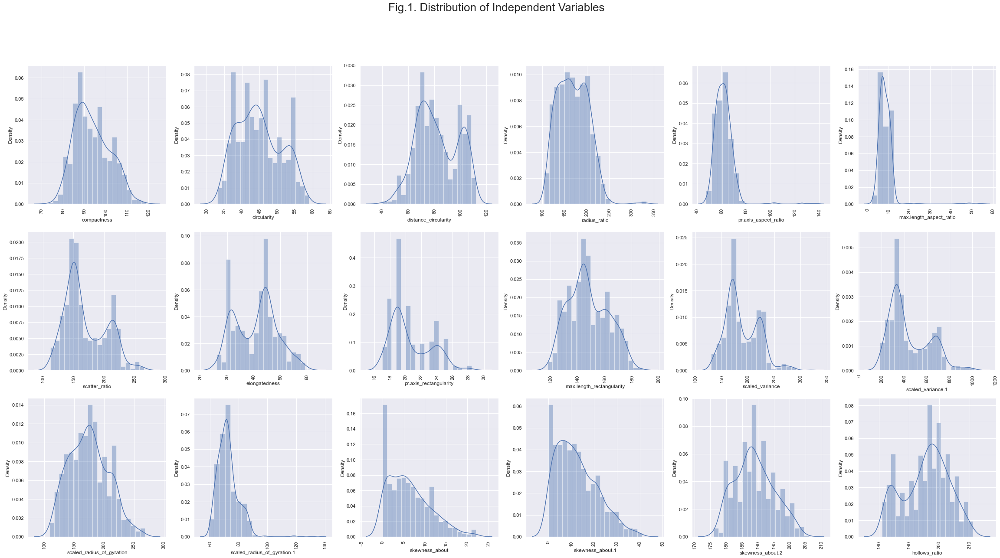

In [15]:
col = indep_var.columns.to_list()                # creating a list of columns present in the subset 

# Plotting the distribution of each independent column in the dataframe
fig, ax = plt.subplots(3, 6, figsize=(40, 20))
fig.suptitle('Fig.1. Distribution of Independent Variables', fontsize=26)
sns.set_style("whitegrid")
for variable, subplot in zip(col, ax.flatten()):
    sns.distplot(df[variable], bins = 20, ax=subplot)
    for label in subplot.get_xticklabels():
        label.set_rotation(90) 

In [16]:
# Distribution wise imputation with central tendancy

df['circularity'] = df['circularity'].fillna(df['circularity'].mean())
df['distance_circularity'] = df['distance_circularity'].fillna(df['distance_circularity'].median())
df['radius_ratio'] = df['radius_ratio'].fillna(df['radius_ratio'].median())
df['pr.axis_aspect_ratio'] = df['pr.axis_aspect_ratio'].fillna(df['pr.axis_aspect_ratio'].median())
df['scatter_ratio'] = df['scatter_ratio'].fillna(df['scatter_ratio'].median())
df['elongatedness'] = df['elongatedness'].fillna(df['elongatedness'].median())
df['pr.axis_rectangularity'] = df['pr.axis_rectangularity'].fillna(df['pr.axis_rectangularity'].median())
df['scaled_variance'] = df['scaled_variance'].fillna(df['scaled_variance'].median())
df['scaled_variance.1'] = df['scaled_variance.1'].fillna(df['scaled_variance.1'].median())
df['scaled_radius_of_gyration'] = df['scaled_radius_of_gyration'].fillna(df['scaled_radius_of_gyration'].mean())
df['scaled_radius_of_gyration.1'] = df['scaled_radius_of_gyration.1'].fillna(df['scaled_radius_of_gyration.1'].median())
df['skewness_about'] = df['skewness_about'].fillna(df['skewness_about'].median())
df['skewness_about.2'] = df['skewness_about.2'].fillna(df['skewness_about.2'].median())

### 1.3. Check and remove of records with duplicate records

In [17]:
# Checking for a duplicate record
duplicate = df[df.duplicated()] # Selecting duplicate rows except first with occurrence based on all columns
print(blue("There are", ["bold"]), duplicate.shape[0], blue("duplicate rows or records in the data.", ["bold"]))

There are 0 duplicate rows or records in the data.


### 1.4. Data Summary

In [18]:
print(blue("The description of the different attributes is given below :", ["bold"]))
df.describe() #describing the entire dataframe

The description of the different attributes is given below :


,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
count,845.000000,845.000000,845.000000,845.000000,845.000000,845.000000,845.000000,845.000000,845.000000,845.000000,845.000000,845.000000,845.000000,845.000000,845.000000,845.000000,845.000000,845.000000
mean,93.661538,44.828775,82.075740,168.835503,61.674556,8.565680,168.827219,40.949112,20.575148,147.975148,188.608284,438.991716,174.663108,72.440237,6.356213,12.602367,188.919527,195.628402
std,8.224573,6.137576,15.734435,33.401658,7.886450,4.603677,33.170691,7.807428,2.585614,14.507903,31.377259,176.353301,32.537370,7.473510,4.903546,8.936081,6.155809,7.442299
min,73.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.000000,59.000000,0.000000,0.000000,176.000000,181.000000
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,147.000000,33.000000,19.000000,137.000000,167.000000,318.000000,149.000000,67.000000,2.000000,5.000000,184.000000,190.000000
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,179.000000,363.000000,174.000000,71.000000,6.000000,11.000000,188.000000,197.000000
75%,100.000000,49.000000,98.000000,195.000000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,217.000000,586.000000,198.000000,75.000000,9.000000,19.000000,193.000000,201.000000
max,119.000000,59.000000,112.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,268.000000,135.000000,22.000000,41.000000,206.000000,211.000000


**The ranges of different variables are different across the dataframe. Therefore, all the values will be converted to their respective z-scores below.**

### 1.5. Converting values to zscore

In [19]:
indep_var = df.drop(labels = "class", axis = 1) # creating a subset dataframe with only independent attributes
scaled_df=indep_var.apply(stats.zscore)         # transforming values to zscore

## 2. Understanding the attributes (Project Q2)

### 2.1. Distribution and pairwise relations

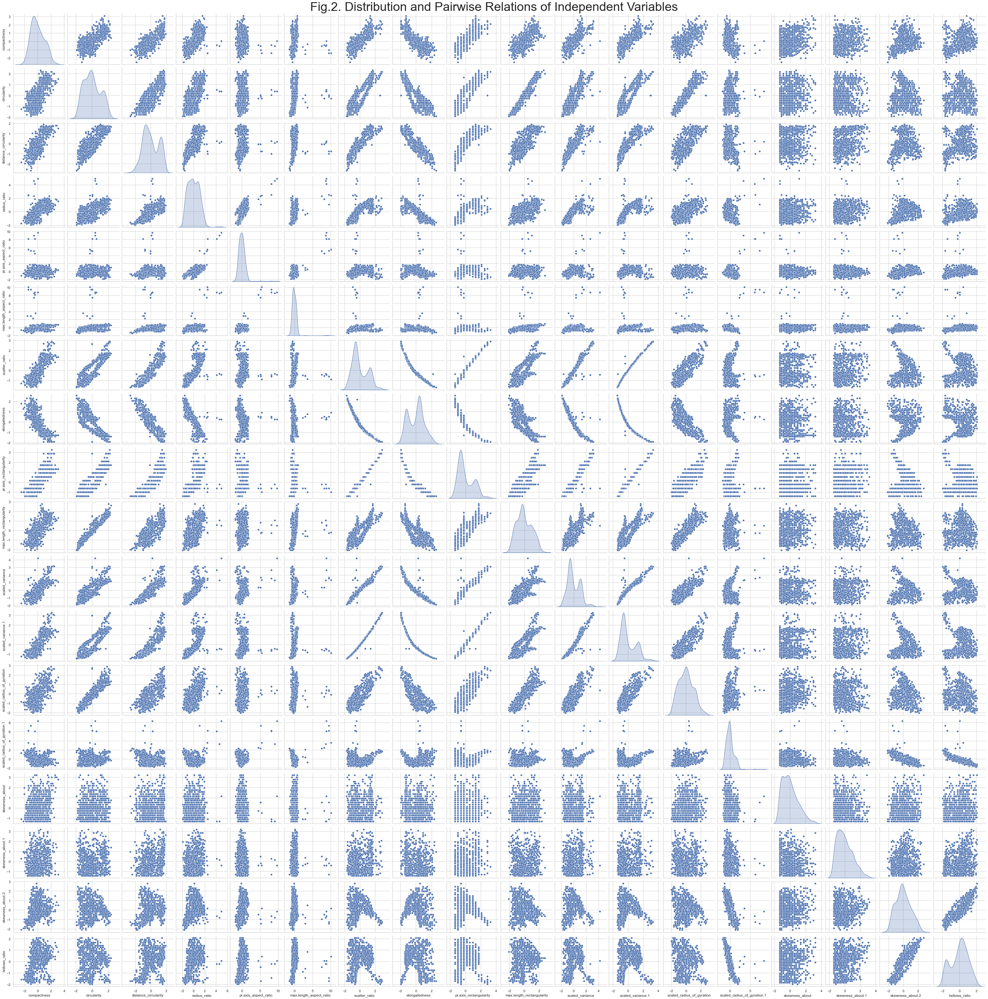

In [20]:
g = sns.pairplot(scaled_df, diag_kind='kde')  
g.fig.suptitle('Fig.2. Distribution and Pairwise Relations of Independent Variables', fontsize=40, y=1);

Sans Compactness and Skewness_about.2 all the remaining variables are having skewed and/or bi/multimodal distribution. The pairplots show a diagonal distribution of scatters for multiple variables, and therefore the independent variables need to be checked for their correlation.

### 2.2. Correlation of independent variables

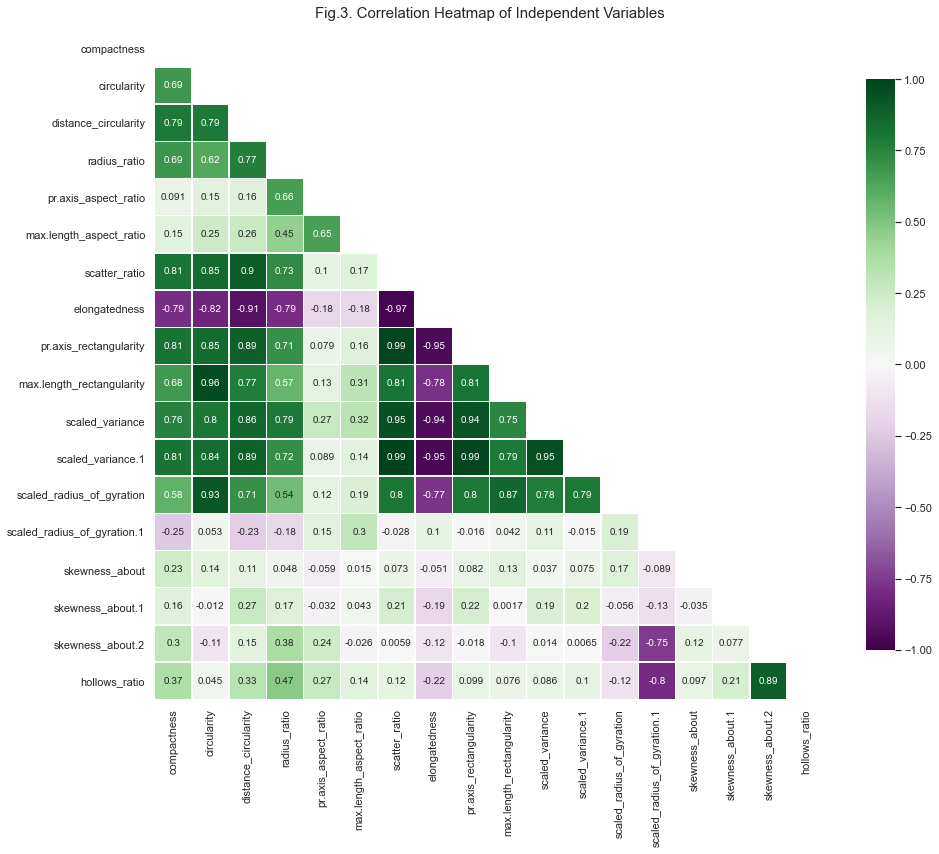

In [21]:
# Creating the correlation matrix 
corr = scaled_df.corr() 

# Draw the heatmap with the correlation matrix
f, ax = plt.subplots(figsize=(15, 15))
cmap = sns.diverging_palette(30, 10, as_cmap=True) # Generate a custom diverging colormap
mask = np.triu(np.ones_like(corr, dtype=bool))
corplot = sns.heatmap(corr, mask=mask, cmap='PRGn', vmin=-1, vmax=1, center=0,
            square=True, annot = True, linewidths=.5, cbar_kws={"shrink": .7})
corplot.set_title('Fig.3. Correlation Heatmap of Independent Variables', fontdict={'fontsize':15}, pad=12);

A correlation coefficient of the magnitude of 0.8 and above (of any direction) conventionally indicates a strong correlation. In the given data multiple independent attributes are having strong correlations. I will find the pairs having correlation of 0.8 or higher.

In [22]:
print(blue("List of strongly positively correlated pairs–– ", ['bold']))
pair = corr.unstack().sort_values().drop_duplicates().sort_values(ascending=False)
pair.loc[~(pair<.8)]  

List of strongly positively correlated pairs–– 


compactness                compactness                  1.000000
scaled_variance.1          scatter_ratio                0.992982
pr.axis_rectangularity     scatter_ratio                0.989735
                           scaled_variance.1            0.988184
circularity                max.length_rectangularity    0.963026
scatter_ratio              scaled_variance              0.950609
scaled_variance.1          scaled_variance              0.947611
scaled_variance            pr.axis_rectangularity       0.936517
circularity                scaled_radius_of_gyration    0.927690
distance_circularity       scatter_ratio                0.904870
                           pr.axis_rectangularity       0.892814
skewness_about.2           hollows_ratio                0.892782
distance_circularity       scaled_variance.1            0.885754
scaled_radius_of_gyration  max.length_rectangularity    0.866177
distance_circularity       scaled_variance              0.862950
circularity              

In [23]:
print(blue("List of strongly nagtively correlated pairs–– ", ['bold']))
pair = corr.unstack().sort_values().drop_duplicates().sort_values(ascending=False)
pair.loc[~(pair>-.8)]  

List of strongly nagtively correlated pairs–– 


scaled_radius_of_gyration.1  hollows_ratio            -0.801983
elongatedness                circularity              -0.823121
distance_circularity         elongatedness            -0.911114
scaled_variance              elongatedness            -0.938031
elongatedness                pr.axis_rectangularity   -0.948904
                             scaled_variance.1        -0.953699
scatter_ratio                elongatedness            -0.971539
dtype: float64

**Sans skewness_about, and skewness_about.1 all the remaining attributes have one or more highly correlated attributes. I will use f-test to select a maximum of 10 best features (2 uncorrelated and 50% from the correlated features).**

### 2.3. Distribution of dependent variable

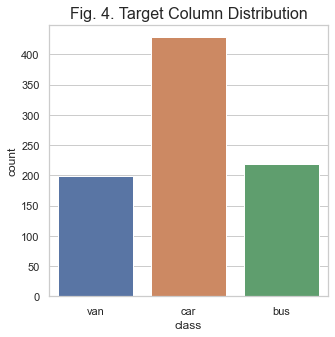

In [24]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.set_style("white")
sns.countplot(df["class"])
plt.title("Fig. 4. Target Column Distribution", fontsize=16);

**The dependent variable shows class imbalance, with the car being the majority class, while van and bus are represented as minority classes. I will use Synthetic Minority Oversampling Technique to address the class imbalance problem.**

### 2.4. Examining bivariate relationships based on dependent variable class

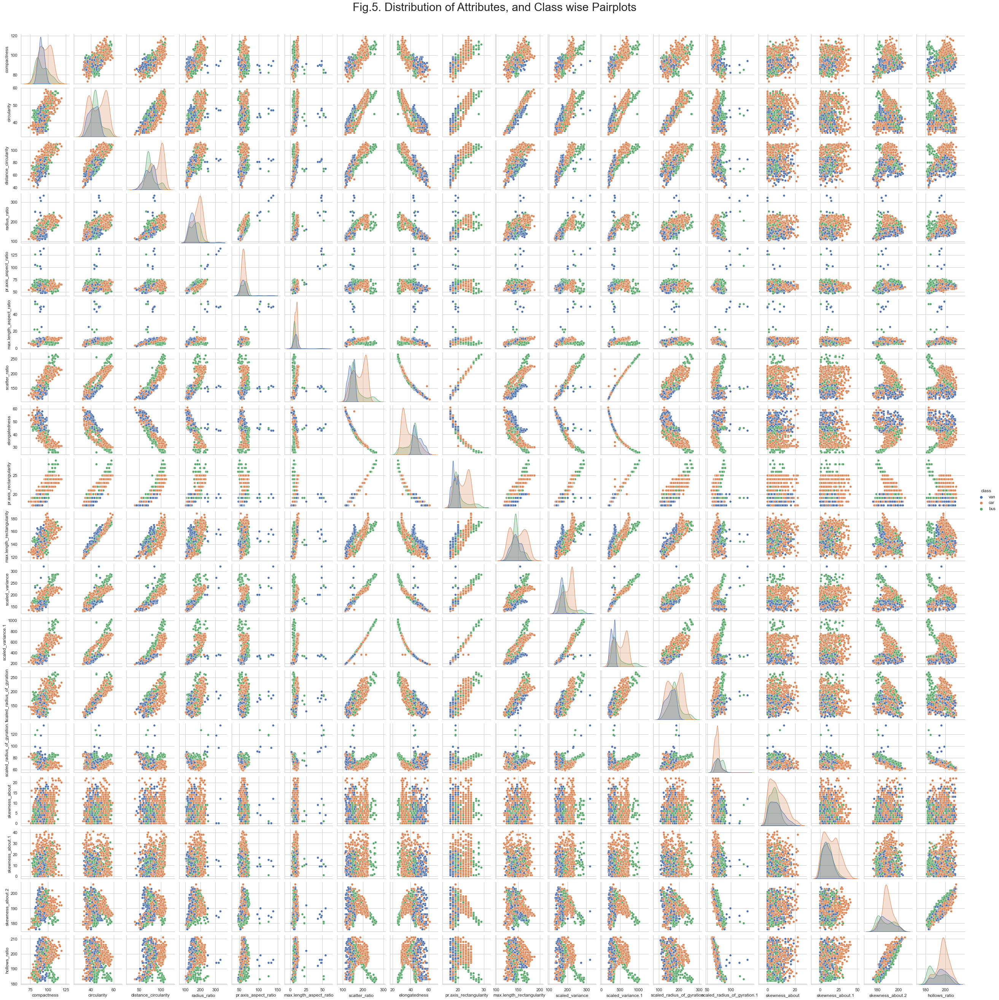

In [25]:
sns.set_style("whitegrid")
g = sns.pairplot(df,hue= "class", size=2)
g.fig.suptitle("Fig.5. Distribution of Attributes, and Class wise Pairplots", fontsize = 30, y=1.02);

Distribution of the features across target variable classes are different.
Given the distribution for each pair across calsses, I will prefer a Radial Basis Function (RBF) kernel parameter over linear. It has infinite number of dimensions and also helps in building complex decision boundaries. Since I won't be using interaction or polynomials of attributes, I shall not use polynomial.

### 2.5. Selecting Attributes for Analysis

#### 2.5.1. Checking Variance Threshold

In [26]:
# Target and feature separation in original dataframe
X = scaled_df
y = df["class"]

In [27]:
vth = VarianceThreshold(threshold=0)

In [28]:
vth.fit(X)

VarianceThreshold(threshold=0)

In [29]:
vth.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True])

#### 2.5.2. Using KBest for feature selection

In [30]:
# Select best features using f test
feature_select = SelectKBest(f_classif, k=10)
X_f = feature_select.fit_transform(X, y)
print(feature_select.get_support()) # prints whether a column is selected (in the same order as that in the dataframe) 

[ True False  True  True False False  True  True  True False  True  True
 False  True False False False  True]


In [31]:
cols = feature_select.get_support(indices=True)
features_df = df.iloc[:,cols]
print("The list of selected features are:")
features_df.columns

The list of selected features are:


Index(['compactness', 'distance_circularity', 'radius_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'scaled_variance',
       'scaled_variance.1', 'scaled_radius_of_gyration.1', 'hollows_ratio'],
      dtype='object')

## 3. Split the data into test and train set (Project Q3)

### 3.1. Split the dataframe into training and testing set 

In [32]:
X_train, X_test, y_train, y_test = train_test_split(X_f, y, test_size=0.30, random_state=42) # Split data into train and test set, random state selected 42

### 3.2. Check and remove class imbalance in the training set

In [33]:
print(blue("The frequency of classess of the label variable in the training data originally was:", ["bold"]), Counter(y_train))

The frequency of classess of the label variable in the training data originally was: Counter({'car': 296, 'bus': 149, 'van': 146})


In [34]:
oversample = SMOTE()
X_train, y_train = oversample.fit_resample(X_train, y_train)
new_counter = Counter(y_train)
print("The frequency of classess of the label variable after SMOTE in the training data in original dataframe:", new_counter)

The frequency of classess of the label variable after SMOTE in the training data in original dataframe: Counter({'bus': 296, 'van': 296, 'car': 296})


## 4. Train a Support Vector Machine (Project Q4)

### 4.1. Setting Support vector Classifier for Training

I have shown two approaches of SVC. In the first approach, the penalty parameter and gamma have not been set. In the second approach, I have checked the hyperparameters using GridSearch Cross-Validation.

In GridSearch CV Hyperparameter tuning, the perspective was that:
1. Larger C values mean larger penalties for each missclassification in the training set. This is useful only if the training data has most extreme observations, and are contain datapoints closest to the boundaries. However, that may not be true and especially if combined with RBF, the model will overfit. So I have used C of 1, 5, 10.
2. Larger gamma values indicate that the class boundaries are further away. However, the trade-off is that the further they are away, the smaller is the region in which each test instance can be included. Therefore, I have started with a smaller gamma of 0.025 and checked upto 0.1.

**I have shown hyperparameter tuning specifying the penalty (C) and gamma under question 5.**

In [35]:
clf_untuned = SVC(kernel='rbf') # only kernel specified

In [36]:
clf_untuned.fit(X_train , y_train)

SVC()

In [37]:
print("Training set score SVM Model with raw data: {:.2f}".format(clf_untuned.score(X_train, y_train)))

Training set score SVM Model with raw data: 0.93


### 4.2. Get Model accuracy on test set

In [38]:
y_pred_0 = clf_untuned.predict(X_test)
print(blue("Validation set score SVC Model with raw data, without hyparameter tuning with GridSearch: {:.2f}").format(clf_untuned.score(X_test, y_test)))

Validation set score SVC Model with raw data, without hyparameter tuning with GridSearch: 0.89


In [39]:
confusion_matrix(y_test, y_pred_0)

array([[ 66,   2,   1],
       [ 10, 107,  15],
       [  0,   0,  53]])

In [40]:
print(classification_report(y_test, y_pred_0))

              precision    recall  f1-score   support

         bus       0.87      0.96      0.91        69
         car       0.98      0.81      0.89       132
         van       0.77      1.00      0.87        53

    accuracy                           0.89       254
   macro avg       0.87      0.92      0.89       254
weighted avg       0.91      0.89      0.89       254



## 5. K-fold Cross validation (Project Q5)

### 5.1. Kfold Cross Validation on Untuned SVC

KFold CV does not require a train-test split. For each iteration, the model is train on (k-1) folds and validated on the unincluded fold. The average of the validation scores is checked as cross validation score. However, **the golden rule of machine learning is not to mix training and test data. So, I have shown a KFold CV on the entire set, just for the sake of comparison and explain overfitting chances.**

In [41]:
kfold = KFold(n_splits=10, random_state=42)
cvs1 = cross_val_score(estimator = clf_untuned, X = X, y = y, cv = kfold) # Kfold on entire data just for demonstration purposes
cvs1

array([0.94117647, 0.96470588, 0.95294118, 0.98823529, 0.96470588,
       0.97619048, 0.98809524, 0.96428571, 0.95238095, 0.96428571])

In [42]:
print(blue("Cross-validation Results of subjective SVC: %.2f (%.2f)") % (cvs1.mean(), cvs1.std()))

Cross-validation Results of subjective SVC: 0.97 (0.01)


### 5.2. Kfold CV on Training Set

In [43]:
kfold = KFold(n_splits=10, random_state=42)
cvs2 = cross_val_score(estimator = clf_untuned, X = X_train, y = y_train, cv = kfold)
cvs2

array([0.84269663, 0.94382022, 0.94382022, 0.80898876, 0.84269663,
       0.85393258, 0.8988764 , 0.96629213, 0.97727273, 1.        ])

In [44]:
print(blue("Cross-validation Results of subjective SVC: %.2f (%.2f)") % (cvs2.mean(), cvs2.std()))

Cross-validation Results of subjective SVC: 0.91 (0.06)


### 5.3. Hyperparameter tuning of SVM using GridSearch cross-validation

In [45]:
parameters = {'kernel':('linear', 'rbf'), 'gamma': [0.025, 0.05, 0.1], 'C':[1, 5, 10]}
svc = SVC()
clf_tuned = GridSearchCV(svc, parameters)
clf_tuned.fit(X_train, y_train)
GridSearchCV(estimator = SVC(), param_grid={'gamma': [0.025, 0.05, 0.1], 'C': [1, 5, 10], 'kernel': ('linear', 'rbf')})

GridSearchCV(estimator=SVC(),
             param_grid={'C': [1, 5, 10], 'gamma': [0.025, 0.05, 0.1],
                         'kernel': ('linear', 'rbf')})

In [46]:
clf_tuned.cv_results_

{'mean_fit_time': array([0.00904341, 0.01026201, 0.00693402, 0.00705314, 0.00641584,
        0.00631127, 0.01118655, 0.0065496 , 0.01167765, 0.00632467,
        0.01102448, 0.00585098, 0.0173934 , 0.00614347, 0.01801305,
        0.00636225, 0.01721025, 0.00625062]),
 'std_fit_time': array([5.62581371e-04, 3.09784004e-04, 4.84405809e-04, 9.20798357e-05,
        1.18143467e-04, 1.08511271e-04, 6.78542047e-04, 2.75057099e-04,
        6.62851171e-04, 3.32524696e-04, 7.09463813e-04, 2.01365199e-04,
        2.26393291e-03, 1.70667113e-04, 2.87516559e-03, 2.74837844e-04,
        2.34576375e-03, 6.92977551e-04]),
 'mean_score_time': array([0.00133166, 0.00218086, 0.00082946, 0.00139961, 0.00076408,
        0.00127678, 0.00076823, 0.00125475, 0.00108566, 0.00131235,
        0.00083189, 0.00104694, 0.00081306, 0.00112777, 0.00085258,
        0.00109701, 0.00075035, 0.0010078 ]),
 'std_score_time': array([2.96261985e-04, 1.35145729e-04, 5.34136375e-05, 2.34924462e-05,
        9.15527344e-06, 3.69

**Hyperparameter set chosen: {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}**

In [47]:
clf_tuned = SVC(gamma=0.1, C=10, kernel='rbf')  

In [48]:
clf_tuned.fit(X_train , y_train)

SVC(C=10, gamma=0.1)

In [49]:
print("Training set score SVM Model with raw data: {:.2f}".format(clf_tuned.score(X_train, y_train)))

Training set score SVM Model with raw data: 0.97


In [50]:
y_pred_1 = clf_tuned.predict(X_test)
print(blue("Validation set score SVC Model with raw data, with hyparameter tuning with GridSearch: {:.2f}").format(clf_tuned.score(X_test, y_test)))

Validation set score SVC Model with raw data, with hyparameter tuning with GridSearch: 0.91


In [51]:
confusion_matrix(y_test, y_pred_1)

array([[ 66,   2,   1],
       [  6, 117,   9],
       [  3,   1,  49]])

In [52]:
print(classification_report(y_test, y_pred_1))

              precision    recall  f1-score   support

         bus       0.88      0.96      0.92        69
         car       0.97      0.89      0.93       132
         van       0.83      0.92      0.88        53

    accuracy                           0.91       254
   macro avg       0.90      0.92      0.91       254
weighted avg       0.92      0.91      0.91       254



In [53]:
kfold = KFold(n_splits=10, random_state=42)
clf_tuned = SVC(gamma=0.1, C=10, kernel='rbf')  
clf_tuned.fit(X_train, y_train)
cvs3 = cross_val_score(estimator = clf_tuned, X = X_train, y = y_train, cv = kfold)
cvs3

array([0.92134831, 0.96629213, 0.94382022, 0.93258427, 0.94382022,
       0.95505618, 0.95505618, 1.        , 0.96590909, 0.98863636])

In [54]:
print(blue("Cross-validation Results of tuned SVC: %.2f (%.2f)") % (cvs3.mean(), cvs3.std()))

Cross-validation Results of tuned SVC: 0.96 (0.02)


### 6. Extract Principal Components that capture 95% variance (Project Q6)

In [55]:
pca = PCA(n_components=18)
pca.fit(X)

PCA(n_components=18)

In [56]:
print(pca.explained_variance_)

[9.40702520e+00 3.01627377e+00 1.90414280e+00 1.18024428e+00
 9.17584620e-01 5.40029680e-01 3.58762711e-01 2.22420771e-01
 1.60210982e-01 9.19567061e-02 6.66631062e-02 4.53930416e-02
 3.57906095e-02 2.59552862e-02 2.02275708e-02 1.57696389e-02
 9.89955706e-03 2.97667541e-03]


In [57]:
print(pca.components_)

[[ 2.75148547e-01  2.93687275e-01  3.04523405e-01  2.67435072e-01
   8.03424102e-02  9.71479681e-02  3.17076598e-01 -3.14083973e-01
   3.13961038e-01  2.82716134e-01  3.09709680e-01  3.13766579e-01
   2.71927594e-01 -2.07226057e-02  4.10074492e-02  5.83483494e-02
   3.02815401e-02  7.38880598e-02]
 [-1.27293004e-01  1.26109949e-01 -7.31739885e-02 -1.89962671e-01
  -1.22384476e-01  1.05150661e-02  4.80076315e-02  1.29454499e-02
   5.98704365e-02  1.16253143e-01  6.19985838e-02  5.36910498e-02
   2.09382090e-01  4.88245224e-01 -5.50734252e-02 -1.24177768e-01
  -5.40793673e-01 -5.40306031e-01]
 [-1.19899034e-01 -2.53111109e-02 -5.59129342e-02  2.75243243e-01
   6.41955087e-01  5.91787423e-01 -9.75145466e-02  5.75307586e-02
  -1.09405362e-01 -1.68242694e-02  5.61542064e-02 -1.08737305e-01
  -3.12390723e-02  2.86552362e-01 -1.15495818e-01 -7.53940443e-02
   8.43775917e-03  3.93490143e-02]
 [ 7.82010154e-02  1.88298230e-01 -7.12133307e-02 -4.26103863e-02
   3.25798642e-02  3.14260189e-02 -9.

In [58]:
print(pca.explained_variance_ratio_)

[5.21994035e-01 1.67372457e-01 1.05660521e-01 6.54915302e-02
 5.09165956e-02 2.99661440e-02 1.99076744e-02 1.23420862e-02
 8.89007683e-03 5.10266009e-03 3.69912306e-03 2.51885122e-03
 1.98601410e-03 1.44025388e-03 1.12242405e-03 8.75054258e-04
 5.49324534e-04 1.65175151e-04]


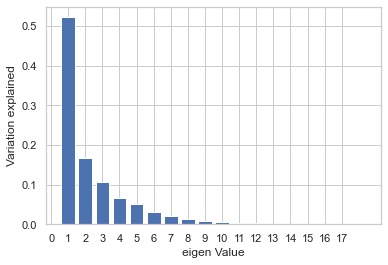

In [59]:
plt.bar(list(range(1,19)),pca.explained_variance_ratio_,alpha=1, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.xticks(np.arange(0, 18, 1));

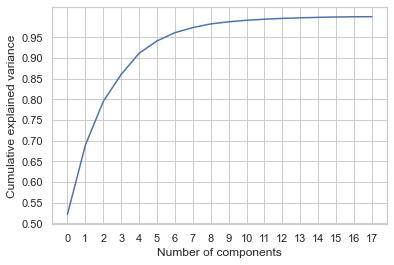

In [60]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
plt.xticks(np.arange(0, 18, 1))
plt.yticks(np.arange(0.5, 1, 0.05));

**95% variance can be explained using 6 components.**
However, 10 features create a 10-dimensional space and based on the above plot there can still be some model improvement using 10 components. **So, I will use both 6 and 10.**

In [61]:
NCOMPONENTS = 6
pca = PCA(n_components=NCOMPONENTS)
X_pca = pca.fit_transform(X)

## 7.  Repeat step 3,4,5 (use Principal Components instead of the original data, and same random state) (Project Q7)

### 7.1. On 6 pricipal components

In [62]:
X_pca_train, X_pca_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.30, random_state=42) # 6 components pca converted

In [63]:
oversample = SMOTE()
X_pca_train, y_train = oversample.fit_resample(X_pca_train, y_train)

In [64]:
clf_pca = SVC(gamma=0.1, C=10, kernel='rbf')  

In [65]:
clf_pca.fit(X_pca_train , y_train)
print("Validation set score SVM Model with pca data: {:.2f}".format(clf_pca.score(X_pca_test, y_test)))

Validation set score SVM Model with pca data: 0.92


In [66]:
parameters = {'kernel':('linear', 'rbf'), 'gamma': [0.025, 0.05, 0.1], 'C':[1, 5, 10]}
svc = SVC()
clf = GridSearchCV(svc, parameters)
clf.fit(X_pca_train, y_train)
GridSearchCV(estimator=SVC(), param_grid={'gamma': [0.025, 0.05, 0.1], 'C': [1, 5, 10], 'kernel': ('linear', 'rbf')})

GridSearchCV(estimator=SVC(),
             param_grid={'C': [1, 5, 10], 'gamma': [0.025, 0.05, 0.1],
                         'kernel': ('linear', 'rbf')})

In [67]:
clf.cv_results_

{'mean_fit_time': array([0.0117312 , 0.00701699, 0.00949435, 0.00592837, 0.00860276,
        0.00602846, 0.02070198, 0.00561042, 0.02087011, 0.00581698,
        0.02250423, 0.00611634, 0.03804393, 0.00612426, 0.03396506,
        0.00559568, 0.03493705, 0.00608349]),
 'std_fit_time': array([0.00135201, 0.00017464, 0.00049817, 0.00015631, 0.00036188,
        0.00022449, 0.00161236, 0.00032085, 0.00179068, 0.00028974,
        0.00182307, 0.00028982, 0.00395021, 0.00021941, 0.00144768,
        0.00026921, 0.00205051, 0.00032497]),
 'mean_score_time': array([0.00111933, 0.00149217, 0.00093665, 0.00116735, 0.00081472,
        0.0012177 , 0.00074677, 0.00107274, 0.00074825, 0.00098195,
        0.00091105, 0.00109282, 0.00088077, 0.0010479 , 0.0007422 ,
        0.00087676, 0.00076642, 0.00094299]),
 'std_score_time': array([2.02108677e-04, 7.50808232e-05, 1.40987500e-04, 1.37956827e-05,
        1.05146151e-04, 1.42391959e-04, 8.56636329e-06, 1.39564298e-05,
        7.87950860e-06, 2.97171711e-

In [68]:
clf_2 = SVC(gamma=0.1, C=10, kernel='rbf') 

In [69]:
clf_2.fit(X_pca_train , y_train)

SVC(C=10, gamma=0.1)

In [70]:
y_pred_3 = clf_2.predict(X_pca_test)

In [71]:
print("Validation set score SVM Model with pca data: {:.2f}".format(clf_2.score(X_pca_test, y_test)))

Validation set score SVM Model with pca data: 0.92


In [72]:
confusion_matrix(y_test, y_pred_3)

array([[ 64,   3,   2],
       [  4, 122,   6],
       [  2,   3,  48]])

In [73]:
print(classification_report(y_test, y_pred_3))

              precision    recall  f1-score   support

         bus       0.91      0.93      0.92        69
         car       0.95      0.92      0.94       132
         van       0.86      0.91      0.88        53

    accuracy                           0.92       254
   macro avg       0.91      0.92      0.91       254
weighted avg       0.92      0.92      0.92       254



In [74]:
kfold = KFold(n_splits=10, random_state=42)
cvs4 = cross_val_score(estimator = clf_2, X = X_pca_train, y = y_train, cv = kfold)
cvs4

array([0.86516854, 0.96629213, 0.92134831, 0.92134831, 0.88764045,
       0.93258427, 0.92134831, 0.98876404, 0.98863636, 1.        ])

In [75]:
print("Results: %.2f (%.2f)" % (cvs4.mean(), cvs4.std()))

Results: 0.94 (0.04)


## 7.2. On 10 pricipal components

In [76]:
pca_2 = PCA(n_components=10)
X_pca_2 = pca_2.fit_transform(X)

In [77]:
X_pca_train_2, X_pca_test_2, y_train, y_test = train_test_split(X_pca_2, y, test_size=0.30, random_state=42) # 10 components pca converted

In [78]:
oversample = SMOTE()
X_pca_train_2, y_train = oversample.fit_resample(X_pca_train_2, y_train)

In [79]:
clf_3 = SVC(gamma=0.1, C=10, kernel='rbf')  

In [80]:
clf_3.fit(X_pca_train_2 , y_train)

SVC(C=10, gamma=0.1)

In [81]:
y_pred_4 = clf_3.predict(X_pca_test_2)

In [82]:
print("Training set score SVM Model with raw data: {:.2f}".format(clf_3.score(X_pca_train_2, y_train)))

Training set score SVM Model with raw data: 1.00


In [83]:
print("Validation set score SVM Model with pca data: {:.2f}".format(clf_3.score(X_pca_test_2, y_test)))

Validation set score SVM Model with pca data: 0.98


In [84]:
confusion_matrix(y_test, y_pred_4)

array([[ 66,   2,   1],
       [  1, 130,   1],
       [  1,   0,  52]])

In [85]:
print(classification_report(y_test, y_pred_4))

              precision    recall  f1-score   support

         bus       0.97      0.96      0.96        69
         car       0.98      0.98      0.98       132
         van       0.96      0.98      0.97        53

    accuracy                           0.98       254
   macro avg       0.97      0.97      0.97       254
weighted avg       0.98      0.98      0.98       254



In [86]:
kfold = KFold(n_splits=10, random_state=42)
cvs5 = cross_val_score(estimator = clf_3, X = X_pca_train_2, y = y_train, cv = kfold)
cvs5

array([0.93258427, 0.97752809, 0.93258427, 0.94382022, 0.97752809,
       0.97752809, 0.96629213, 1.        , 0.98863636, 1.        ])

In [87]:
print("Cross-validation Score Results: %.2f (%.2f)" % (cvs5.mean(), cvs5.std()))

Cross-validation Score Results: 0.97 (0.02)


In [88]:
repeatedkfold = RepeatedKFold(n_splits=10, n_repeats=10, random_state=42)
cvs6 = cross_val_score(estimator = clf_3, X = X_pca_train_2, y = y_train, cv = repeatedkfold)
cvs6

array([0.98876404, 0.93258427, 0.97752809, 0.96629213, 0.98876404,
       1.        , 0.97752809, 0.98876404, 0.97727273, 0.97727273,
       0.95505618, 0.95505618, 0.98876404, 0.96629213, 1.        ,
       0.96629213, 0.96629213, 0.97752809, 0.96590909, 0.97727273,
       0.97752809, 0.95505618, 0.97752809, 0.98876404, 0.95505618,
       1.        , 0.92134831, 0.97752809, 0.97727273, 0.96590909,
       0.97752809, 0.96629213, 0.96629213, 0.97752809, 0.91011236,
       0.96629213, 0.95505618, 0.96629213, 0.98863636, 0.97727273,
       0.93258427, 0.98876404, 0.97752809, 0.98876404, 0.96629213,
       0.96629213, 0.96629213, 0.95505618, 0.98863636, 1.        ,
       0.94382022, 0.98876404, 0.95505618, 0.98876404, 0.96629213,
       0.94382022, 0.98876404, 0.95505618, 0.98863636, 0.97727273,
       1.        , 0.98876404, 0.95505618, 0.95505618, 0.98876404,
       0.94382022, 1.        , 0.97752809, 0.98863636, 0.96590909,
       0.98876404, 0.94382022, 1.        , 0.97752809, 0.98876

In [89]:
print("Cross-validation Score Results: %.2f (%.2f)" % (cvs6.mean(), cvs6.std()))

Cross-validation Score Results: 0.97 (0.02)


## 8. Compare the accuracy scores and cross validation scores of Support vector machines (Project Q8)

**The accuracy score of the four SVM classification models are:**
1. Untuned SVC on Raw Data: 0.89
2. Tuned SVC on Raw Data: 0.91
3. Tuned SVC on 6 principal components: 0.92
4. Tuned SVC on 10 principal components: 0.98       


**Classification Report:**

*SVM on raw data:*

bus:       precision: 0.88      recall: 0.96      f1: 0.92        
car:       precision: 0.97      recall: 0.89      f1: 0.93       
van:       precision: 0.83      recall: 0.92      f1: 0.88 

*SVM on 10-component pca data:*

bus:       precision: 0.97      recall: 0.96      f1: 0.96        
car:       precision: 0.98      recall: 0.98      f1: 0.98       
van:       precision: 0.96      recall: 0.98      f1: 0.97 

*SVM on 6-component pca data:*

bus:       precision: 0.91      recall: 0.93      f1: 0.92        
car:       precision: 0.95      recall: 0.92      f1: 0.94       
van:       precision: 0.86      recall: 0.91      f1: 0.88



* The post 10 component pca model demonstrated superiority for F1 score for all the three classes compared to the raw model.

* Even the post 6 component pca model demonstrated better and much balanced performance. It had almost similar F1 score as raw model, but more balanced in terms of precision and recall.

* The raw model produced unbalanced score– either high precision or high recall. For example, the raw model detected more number of buses from the silhoutte of buses. But, while doing so, it predicted some silhoutte as buses which were actually cars or vans.

**Implications:**

* PCA followed by SVM was better compared to feature selection through Exploratory Data Analysis and Kbest method of feature selection.
* Hyperparameter tuning improved model accuracy.
* Overfitting was less in post pca SVM classifiers. (by comparing training and test set sccuracy scores given in respective sections.

**KFold CrossValidation:**

* KFold CV reduced overfitting, as the cross-val score on raw data for the SVM was 0.92 compared to training set accuracy without KFold CV as 0.94. 
* Repeated KFold CV, as demonstrated in post pca (10 component SVM model), reduces the noise and therefore reduces the standard error in accuracy (from 0.03 to 0.02), which is a common drawback of KFold.Therefore, I would prefer RepeatedKFold.
* Cross-validation scores for pca model was higher than accuracy score on test set for post 6 components pca svm, again indicating superiority, and at the same time robustness (less ovefit).
